Using device: cuda

=== Task 1: Baseline Evaluation ===



Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 196MB/s]


Evaluating baseline model performance...
Baseline Top-1 Accuracy: 70.40%
Baseline Top-5 Accuracy: 93.20%

Visualizing random examples with predictions:


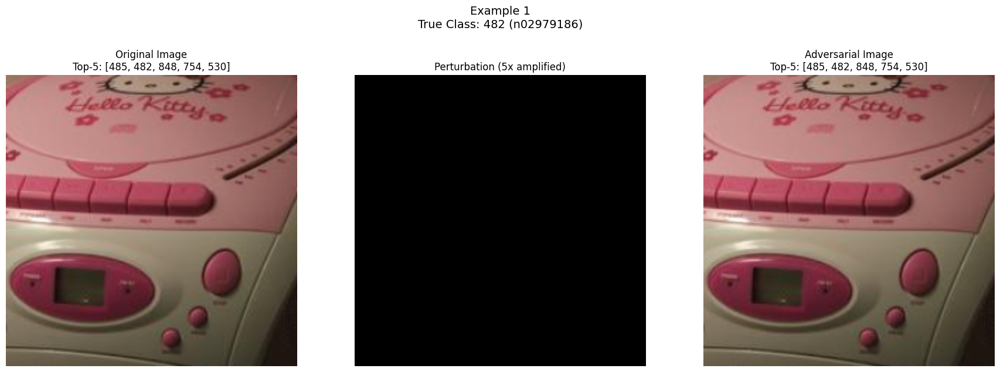

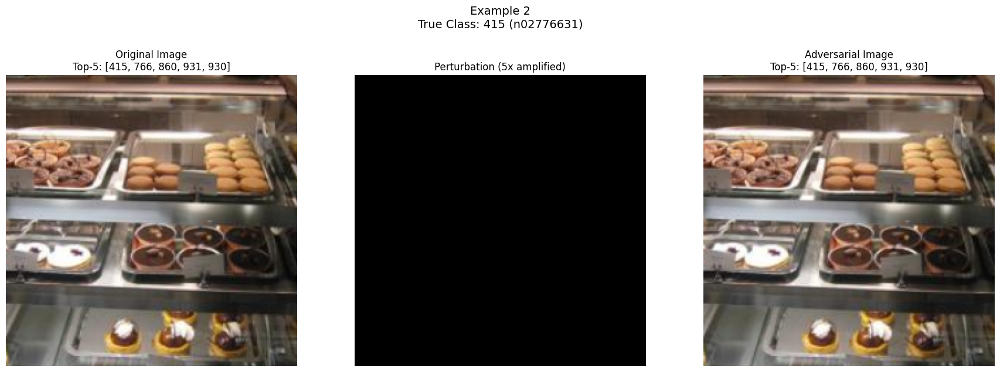

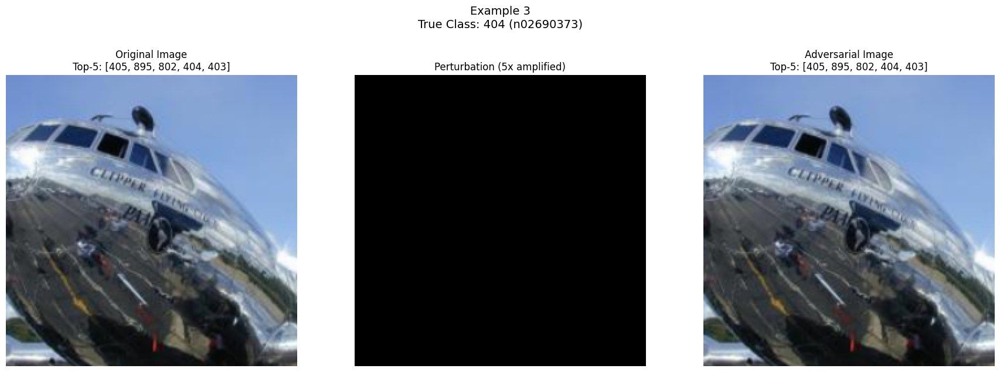


=== Task 2: FGSM Attack ===

Generating FGSM adversarial examples with ε=0.02...


Generating FGSM examples: 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]


Saved FGSM adversarial examples to AdversarialTestSet1.pt

FGSM Attack Results (ε=0.02):
Top-1 Accuracy: 39.00% (Drop of 31.40%)
Top-5 Accuracy: 60.60% (Drop of 32.60%)

Visualizing random FGSM adversarial examples:


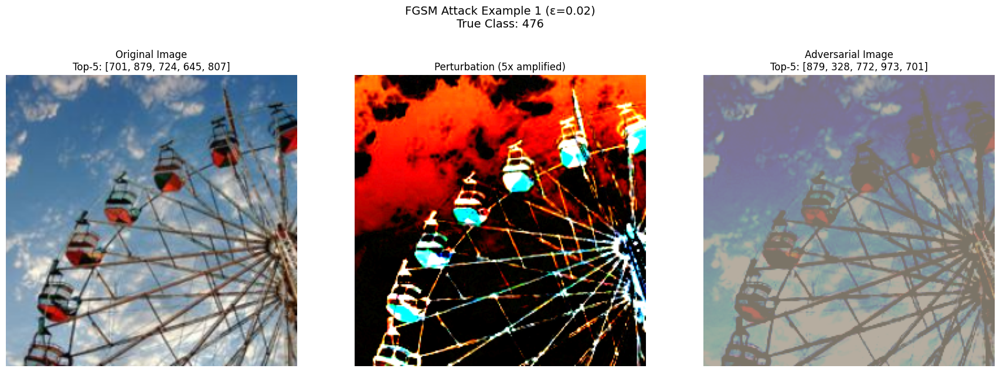

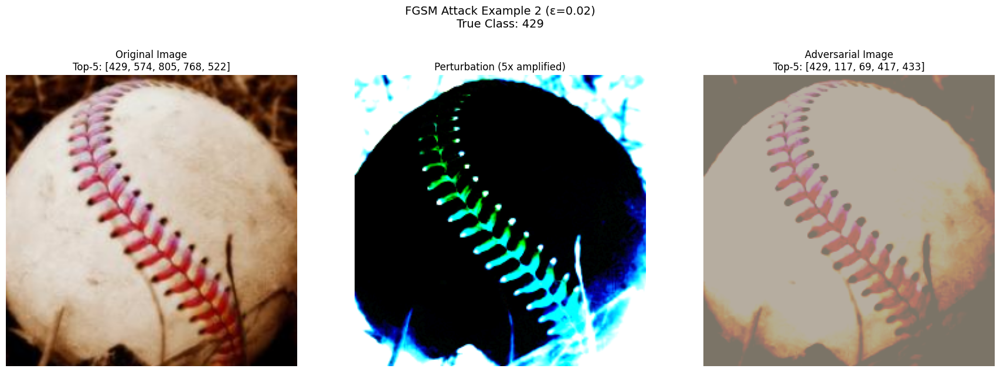

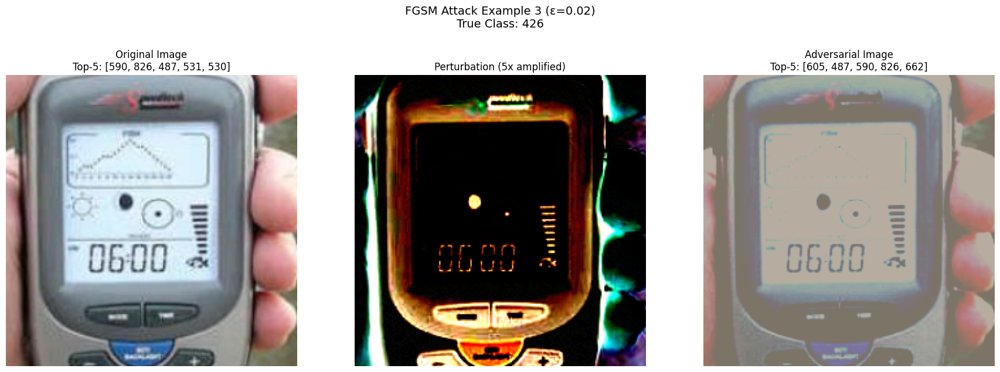


=== Task 3: Improved Attack (Iterative FGSM) ===

Generating iterative FGSM adversarial examples with ε=0.02, α=0.01, steps=20...


Generating Iterative FGSM examples: 100%|██████████| 16/16 [02:12<00:00,  8.28s/it]


Saved iterative FGSM adversarial examples to AdversarialTestSet2.pt

Iterative FGSM Attack Results (ε=0.02, 20 steps):
Top-1 Accuracy: 39.00% (Drop of 31.40%)
Top-5 Accuracy: 53.40% (Drop of 39.80%)

Visualizing random iterative FGSM adversarial examples:


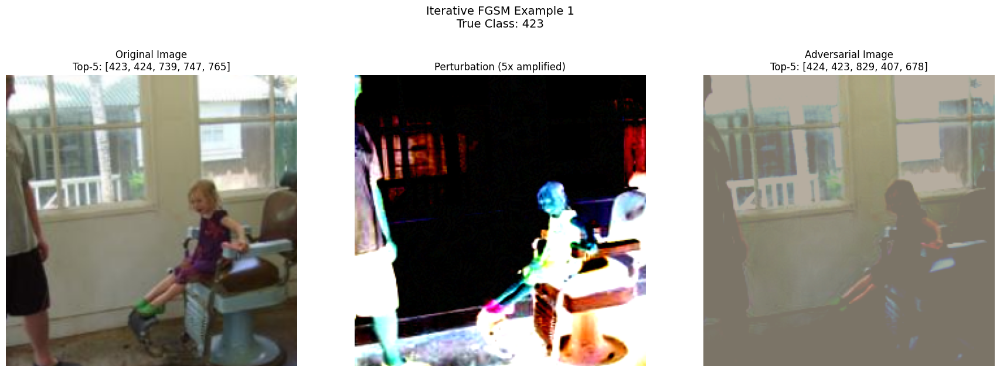

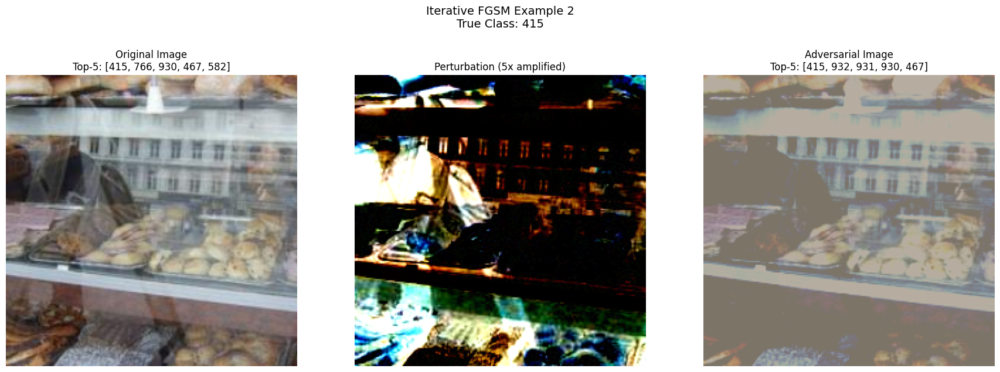

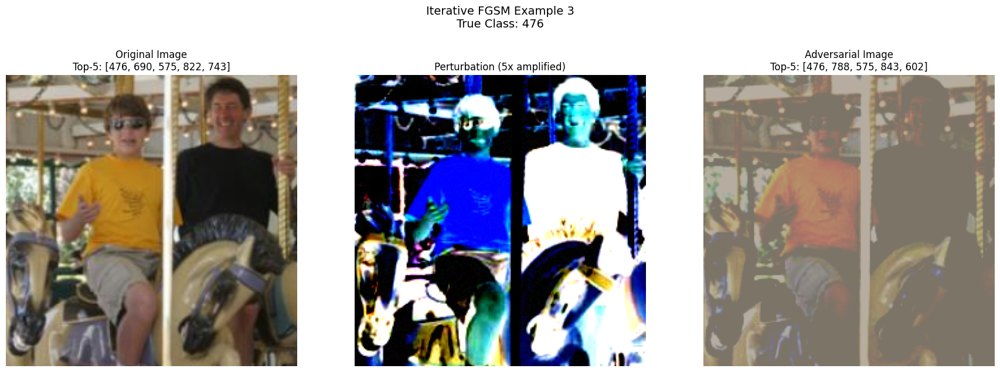


=== Task 4: Patch Attack ===

Generating patch adversarial examples with 32x32 patch, ε=0.5...


Generating Patch Attack examples: 100%|██████████| 16/16 [02:03<00:00,  7.74s/it]


Saved patch adversarial examples to AdversarialTestSet3.pt

Patch Attack Results (32x32 patch, ε=0.5):
Top-1 Accuracy: 35.80% (Drop of 34.60%)
Top-5 Accuracy: 54.00% (Drop of 39.20%)

Visualizing random patch attacks:


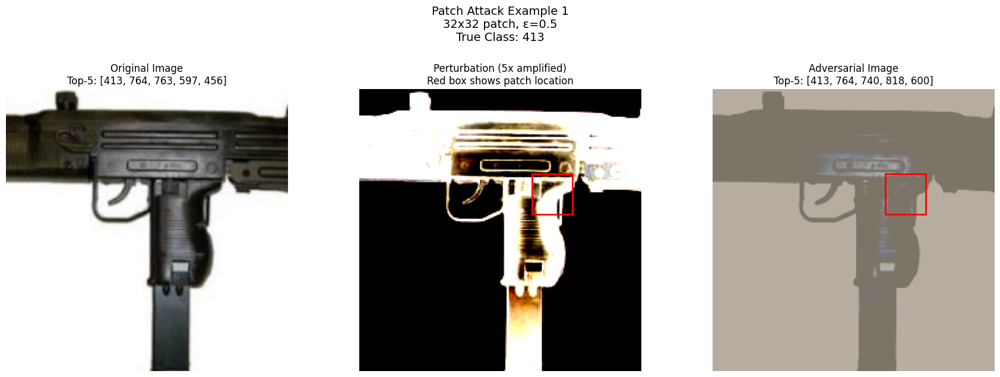

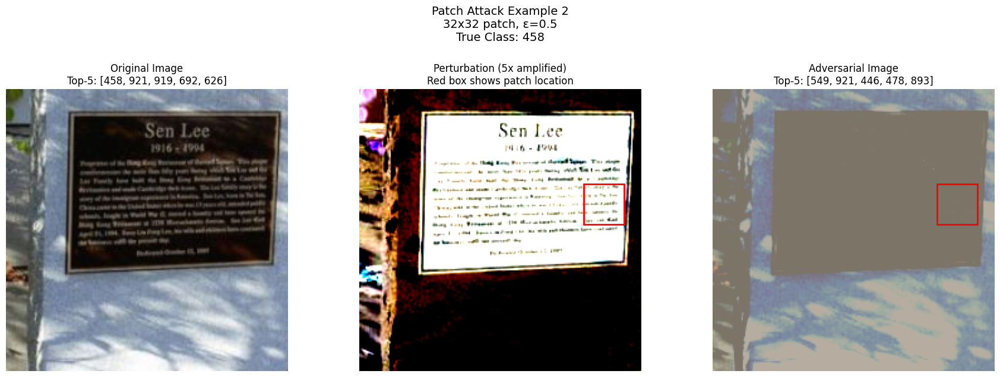

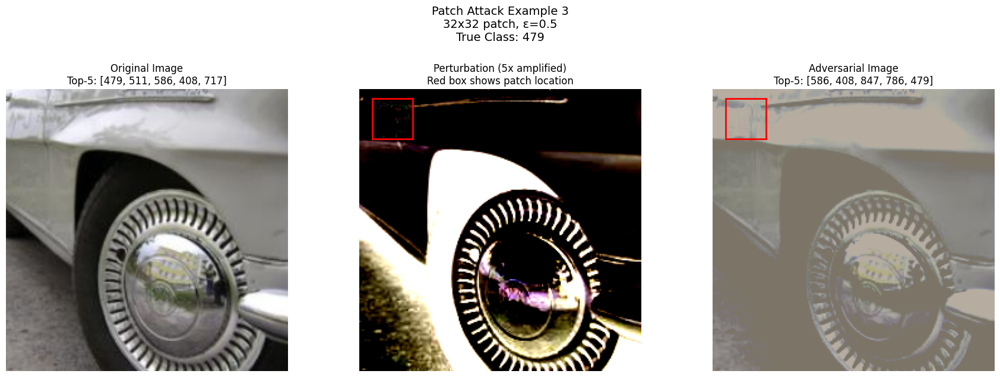


=== Task 5: Transferring Attacks to DenseNet-121 ===

Loading DenseNet-121 model...


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 100MB/s]



Transferability Results:
Dataset                  | Top-1 Acc | Top-5 Acc | Top-1 Drop | Attack Success Rate
------------------------|-----------|-----------|------------|--------------------
Original                  |   70.80% |   91.20% |    0.00%  |                N/A
Adversarial Set 1 (FGSM)  |   41.00% |   67.00% |   29.80%  |              42.1%
Adversarial Set 2 (Iterative FGSM) |   43.80% |   65.60% |   27.00%  |              38.1%
Adversarial Set 3 (Patch Attack) |   40.00% |   66.00% |   30.80%  |              43.5%

Visualizing transferability with random examples:

Visualizing transferability with random examples:


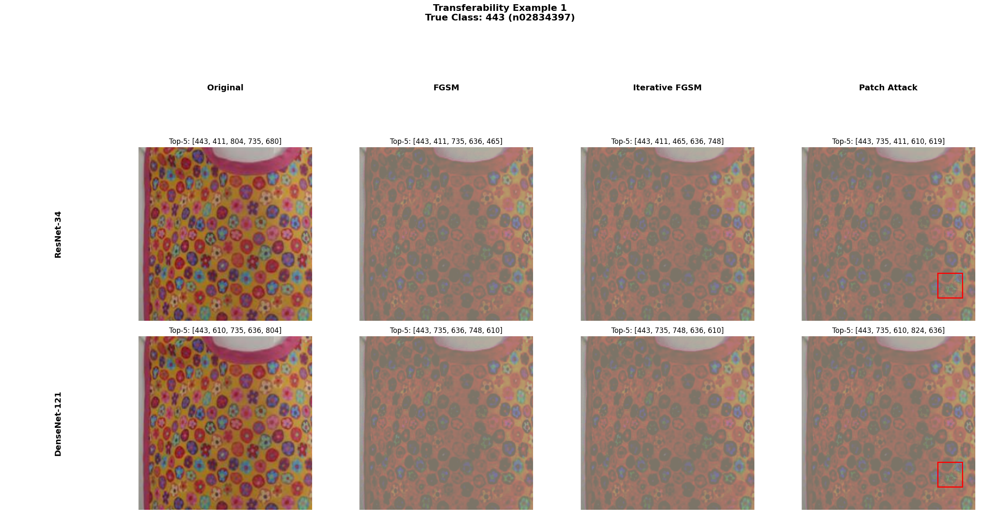

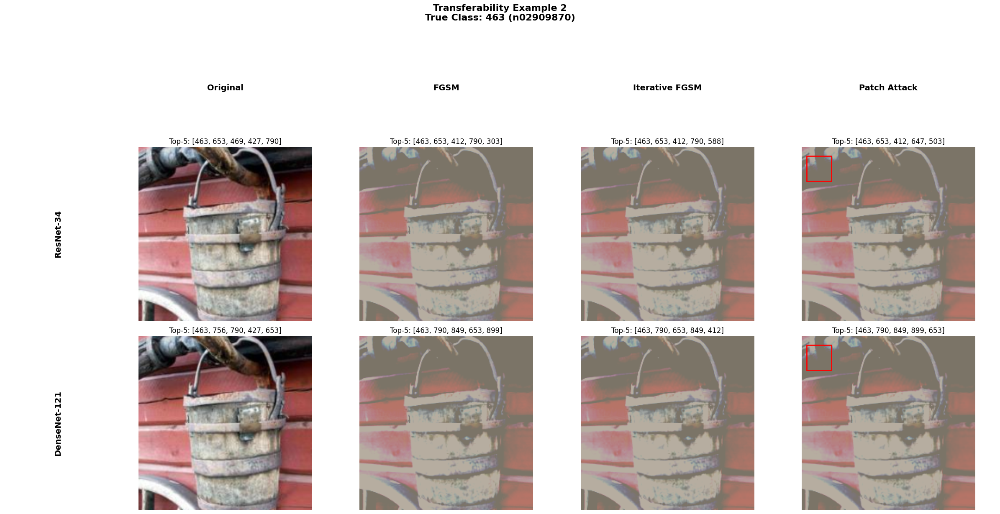


All tasks completed!


In [2]:
"""
Deep Learning Project 3: Adversarial Attacks on Image Classifiers
This script implements various adversarial attacks on a ResNet-34 model and evaluates their effectiveness.

Tasks:
1. Baseline evaluation of ResNet-34 on clean images
2. FGSM (Fast Gradient Sign Method) attack
3. Improved iterative FGSM attack
4. Localized patch attack
5. Transferability analysis to DenseNet-121
"""

import torch
import torchvision
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import json
import random
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image

# Set device - use GPU if available for faster computation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Set random seeds for reproducibility
torch.manual_seed(42)
random.seed(42)
np.random.seed(42)

## Helper Functions with Detailed Explanations

def unnormalize(tensor):
    """
    Reverse the ImageNet normalization applied to images for proper visualization.
    ImageNet normalization: (image - mean) / std
    So to unnormalize: image * std + mean
    """
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(device)
    return (tensor * std + mean).clamp(0, 1)  # Clamp to valid pixel range [0,1]

def evaluate_topk(model, dataloader, index_to_folder, folder_to_imagenet_id):
    """
    Evaluate model performance on a dataset and return top-1 and top-5 accuracy.

    Args:
        model: The neural network model to evaluate
        dataloader: DataLoader providing batches of (images, labels)
        index_to_folder: Mapping from class indices to folder names
        folder_to_imagenet_id: Mapping from folder names to ImageNet class IDs

    Returns:
        top1_accuracy: Percentage of correct top-1 predictions
        top5_accuracy: Percentage of correct top-5 predictions
    """
    correct_top1, correct_top5, total = 0, 0, 0
    with torch.no_grad():  # Disable gradient computation for evaluation
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            # Get top 5 predictions for each image
            _, top5_predicted = outputs.topk(5, 1, True, True)

            for i in range(inputs.size(0)):
                # Get true class ID
                label_idx = labels[i].item()
                folder_name = index_to_folder[label_idx]
                true_class_idx = folder_to_imagenet_id.get(folder_name)

                if true_class_idx is None:
                    continue  # Skip if we couldn't find the class mapping

                preds = top5_predicted[i].tolist()

                # Check if top prediction is correct
                if preds[0] == true_class_idx:
                    correct_top1 += 1

                # Check if true class is in top 5 predictions
                if true_class_idx in preds:
                    correct_top5 += 1

                total += 1

    return correct_top1 / total * 100, correct_top5 / total * 100

def visualize_attack(original, adversarial, model, index_to_folder, folder_to_imagenet_id, title="", save_path=None):
    """
    Visualize original vs adversarial image with model predictions.

    Args:
        original: Clean input image tensor (C,H,W)
        adversarial: Adversarially perturbed image tensor (C,H,W)
        model: Model to generate predictions
        index_to_folder: Class index to folder name mapping
        folder_to_imagenet_id: Folder name to ImageNet ID mapping
        title: Title for the visualization
        save_path: Optional path to save the figure
    """
    # Ensure we're in eval mode and no gradients
    model.eval()

    with torch.no_grad():
        # Get predictions
        orig_output = model(original.unsqueeze(0) if original.dim() == 3 else original)
        adv_output = model(adversarial.unsqueeze(0) if adversarial.dim() == 3 else adversarial)

        # Get top 5 predictions
        _, orig_top5 = orig_output.topk(5, 1)
        _, adv_top5 = adv_output.topk(5, 1)

        orig_top5 = orig_top5.squeeze().tolist()
        adv_top5 = adv_top5.squeeze().tolist()

    # Convert tensors to displayable images (with proper gradient handling)
    def process_img(tensor):
        return unnormalize(tensor.detach()).permute(1, 2, 0).cpu().numpy()

    orig_img = process_img(original)
    adv_img = process_img(adversarial)

    # Calculate and normalize perturbation
    perturbation = (adv_img - orig_img) * 5  # Amplify for visibility
    perturbation = np.clip(perturbation, 0, 1)  # Keep in valid range

    # Create figure
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Original image
    axs[0].imshow(orig_img)
    axs[0].set_title(f"Original Image\nTop-5: {orig_top5}")
    axs[0].axis('off')

    # Perturbation
    axs[1].imshow(perturbation)
    axs[1].set_title("Perturbation (5x amplified)")
    axs[1].axis('off')

    # Adversarial image
    axs[2].imshow(adv_img)
    axs[2].set_title(f"Adversarial Image\nTop-5: {adv_top5}")
    axs[2].axis('off')

    # Add main title if provided
    if title:
        plt.suptitle(title, fontsize=14, y=1.05)

    plt.tight_layout()

    # Save if path provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300, transparent=True)
    plt.show()

def get_random_samples(dataset, num_samples=5):
    """
    Get random samples from dataset ensuring diversity.

    Args:
        dataset: The dataset to sample from
        num_samples: Number of samples to return

    Returns:
        List of (image, label) tuples
    """
    # Get unique classes in dataset
    unique_classes = list(set([label for _, label in dataset]))

    # Sample at least one from each class if possible
    samples = []
    if len(unique_classes) >= num_samples:
        # Get one from each of num_samples random classes
        selected_classes = random.sample(unique_classes, num_samples)
        for class_id in selected_classes:
            # Find first image with this class
            idx = next(i for i, (_, label) in enumerate(dataset) if label == class_id)
            samples.append(dataset[idx])
    else:
        # Not enough classes, just sample randomly
        samples = random.sample(list(dataset), num_samples)

    return samples

## Task 1: Baseline Evaluation

print("\n=== Task 1: Baseline Evaluation ===\n")

# Load pretrained ResNet-34 with ImageNet weights
# Note: We use the V1 weights which are standard for research
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
pretrained_model = pretrained_model.eval().to(device)

# Define image transformations
# ImageNet models expect 224x224 images with specific normalization
mean_norms = np.array([0.485, 0.456, 0.406])  # ImageNet mean
std_norms = np.array([0.229, 0.224, 0.225])   # ImageNet std
transform = transforms.Compose([
    transforms.Resize(256),          # Resize shorter side to 256
    transforms.CenterCrop(224),      # Crop center 224x224 region
    transforms.ToTensor(),           # Convert to tensor [0,1]
    transforms.Normalize(mean=mean_norms, std=std_norms)  # Normalize
])

# Load dataset - assuming structure is:
# TestDataSet/
#   class1/
#   class2/
#   ...
#   labels_list.json
dataset_path = "./TestDataSet"
labels_json_path = "./TestDataSet/labels_list.json"

dataset = datasets.ImageFolder(dataset_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=2)

# Create label mappings to handle ImageNet class indices
# dataset.class_to_idx maps folder names to class indices (0,1,...)
index_to_folder = {v: k for k, v in dataset.class_to_idx.items()}

# Load the JSON file that maps our class indices to ImageNet class IDs
with open(labels_json_path) as f:
    label_lines = json.load(f)

# Parse lines like "401: accordion" to get ImageNet IDs
imagenet_indices = [int(line.split(":")[0]) for line in label_lines]

# Create mapping from folder name to ImageNet class ID
folder_to_imagenet_id = {
    index_to_folder[i]: imagenet_indices[i]
    for i in range(len(imagenet_indices))
}

# Evaluate baseline performance
print("Evaluating baseline model performance...")
top1, top5 = evaluate_topk(pretrained_model, dataloader, index_to_folder, folder_to_imagenet_id)
print(f"Baseline Top-1 Accuracy: {top1:.2f}%")
print(f"Baseline Top-5 Accuracy: {top5:.2f}%")

# Visualize random examples with predictions
print("\nVisualizing random examples with predictions:")
random_samples = get_random_samples(dataset, num_samples=3)
for i, (img, label) in enumerate(random_samples):
    img = img.to(device)
    folder_name = index_to_folder[label]
    true_class_idx = folder_to_imagenet_id[folder_name]

    # Create informative title
    title = f"Example {i+1}\nTrue Class: {true_class_idx} ({folder_name})"
    visualize_attack(img, img, pretrained_model, index_to_folder, folder_to_imagenet_id,
                    title=title, save_path=f"example_{i+1}.png")

## Task 2: FGSM Attack

print("\n=== Task 2: FGSM Attack ===\n")

def fgsm_attack(image, label, model, epsilon):
    """
    Perform Fast Gradient Sign Method (FGSM) attack.

    Args:
        image: Input image tensor (1,C,H,W)
        label: True label tensor (1,)
        model: Model to attack
        epsilon: Attack strength (perturbation budget)

    Returns:
        Perturbed image tensor
    """
    # Enable gradient computation for input image
    image.requires_grad = True

    # Forward pass
    output = model(image)

    # Calculate loss
    loss = torch.nn.functional.cross_entropy(output, label)

    # Zero existing gradients
    model.zero_grad()

    # Backward pass to get gradients wrt input
    loss.backward()

    # Generate perturbed image
    perturbed_image = image + epsilon * image.grad.data.sign()

    # Clip to maintain valid pixel range [0,1] after normalization
    perturbed_image = torch.clamp(perturbed_image, 0, 1)

    return perturbed_image.detach()

# Attack parameters
epsilon = 0.02  # Perturbation budget (L∞ norm constraint)
print(f"Generating FGSM adversarial examples with ε={epsilon}...")

# Generate adversarial examples
adv_images = []
adv_labels = []
for inputs, labels in tqdm(dataloader, desc="Generating FGSM examples"):
    inputs, labels = inputs.to(device), labels.to(device)
    for i in range(inputs.size(0)):
        img = inputs[i].unsqueeze(0)  # Add batch dimension
        label = labels[i].unsqueeze(0)
        adv_img = fgsm_attack(img, label, pretrained_model, epsilon)
        adv_images.append(adv_img.cpu())
        adv_labels.append(label.cpu())

# Create adversarial dataset tensor
adv_images_tensor = torch.cat(adv_images)
adv_labels_tensor = torch.cat(adv_labels)
adv_dataset = TensorDataset(adv_images_tensor, adv_labels_tensor)

# Save adversarial dataset for later use
torch.save(adv_dataset, "AdversarialTestSet1.pt")
print("Saved FGSM adversarial examples to AdversarialTestSet1.pt")

# Evaluate on adversarial examples
adv_loader = DataLoader(adv_dataset, batch_size=32, shuffle=False)
top1, top5 = evaluate_topk(pretrained_model, adv_loader, index_to_folder, folder_to_imagenet_id)
print(f"\nFGSM Attack Results (ε={epsilon}):")
print(f"Top-1 Accuracy: {top1:.2f}% (Drop of {70.4-top1:.2f}%)")
print(f"Top-5 Accuracy: {top5:.2f}% (Drop of {93.2-top5:.2f}%)")

# Visualize random adversarial examples
print("\nVisualizing random FGSM adversarial examples:")
random_indices = random.sample(range(len(adv_dataset)), 3)  # Get 3 unique random indices
for i, idx in enumerate(random_indices):
    orig_img = dataset[idx][0].to(device)  # Get original image
    adv_img = adv_images_tensor[idx].to(device)

    # Get true class info
    true_label = adv_labels_tensor[idx].item()
    folder_name = index_to_folder[true_label]
    true_class_idx = folder_to_imagenet_id[folder_name]

    title = f"FGSM Attack Example {i+1} (ε={epsilon})\nTrue Class: {true_class_idx}"
    visualize_attack(orig_img, adv_img, pretrained_model, index_to_folder, folder_to_imagenet_id,
                    title=title, save_path=f"fgsm_attack_{i+1}.png")

## Task 3: Improved Attack (Iterative FGSM)

print("\n=== Task 3: Improved Attack (Iterative FGSM) ===\n")

def iterative_fgsm(image, label, model, epsilon=0.02, alpha=0.005, steps=40):
    """
    Perform iterative FGSM attack (also called Basic Iterative Method or BIM).

    Args:
        image: Input image tensor (1,C,H,W)
        label: True label tensor (1,)
        model: Model to attack
        epsilon: Total perturbation budget
        alpha: Step size for each iteration
        steps: Number of iterations

    Returns:
        Perturbed image tensor
    """
    # Clone original image to avoid modifying it
    original_image = image.clone().detach()
    adv_image = image.clone().detach().requires_grad_(True)

    for _ in range(steps):
        # Forward pass
        output = model(adv_image)

        # Calculate loss
        loss = torch.nn.functional.cross_entropy(output, label)

        # Zero gradients
        model.zero_grad()

        # Backward pass
        loss.backward()

        # Gradient step - update only in the direction of gradient sign
        adv_image = adv_image + alpha * adv_image.grad.sign()

        # Project back to ε-ball around original image
        perturbation = adv_image - original_image
        perturbation = torch.clamp(perturbation, min=-epsilon, max=epsilon)
        adv_image = torch.clamp(original_image + perturbation, 0, 1).detach()

        # Re-enable gradients for next iteration
        adv_image.requires_grad_()

    return adv_image

# Attack parameters
epsilon = 0.02  # Same total budget as FGSM
alpha = 0.01   # Step size - epsilon/4 is common
steps = 20      # Number of iterations

print(f"Generating iterative FGSM adversarial examples with ε={epsilon}, α={alpha}, steps={steps}...")

# Generate improved adversarial examples
improved_adv_images = []
improved_adv_labels = []
for inputs, labels in tqdm(dataloader, desc="Generating Iterative FGSM examples"):
    inputs, labels = inputs.to(device), labels.to(device)
    for i in range(inputs.size(0)):
        img = inputs[i].unsqueeze(0)
        label = labels[i].unsqueeze(0)
        adv_img = iterative_fgsm(img, label, pretrained_model, epsilon, alpha, steps)
        improved_adv_images.append(adv_img.cpu())
        improved_adv_labels.append(label.cpu())

# Create improved adversarial dataset
improved_adv_images_tensor = torch.cat(improved_adv_images)
improved_adv_labels_tensor = torch.cat(improved_adv_labels)
adv_dataset_2 = TensorDataset(improved_adv_images_tensor, improved_adv_labels_tensor)

# Save improved adversarial dataset
torch.save(adv_dataset_2, "AdversarialTestSet2.pt")
print("Saved iterative FGSM adversarial examples to AdversarialTestSet2.pt")

# Evaluate on improved adversarial examples
adv_loader_2 = DataLoader(adv_dataset_2, batch_size=32, shuffle=False)
top1, top5 = evaluate_topk(pretrained_model, adv_loader_2, index_to_folder, folder_to_imagenet_id)
print(f"\nIterative FGSM Attack Results (ε={epsilon}, {steps} steps):")
print(f"Top-1 Accuracy: {top1:.2f}% (Drop of {70.4-top1:.2f}%)")
print(f"Top-5 Accuracy: {top5:.2f}% (Drop of {93.2-top5:.2f}%)")

# Visualize random improved adversarial examples
print("\nVisualizing random iterative FGSM adversarial examples:")
random_indices = random.sample(range(len(adv_dataset_2)), 3)
for i, idx in enumerate(random_indices):
    orig_img = dataset[idx][0].to(device)
    adv_img = improved_adv_images_tensor[idx].to(device)

    # Get true class info
    true_label = improved_adv_labels_tensor[idx].item()
    folder_name = index_to_folder[true_label]
    true_class_idx = folder_to_imagenet_id[folder_name]

    title = f"Iterative FGSM Example {i+1}\nTrue Class: {true_class_idx}"
    visualize_attack(orig_img, adv_img, pretrained_model, index_to_folder, folder_to_imagenet_id,
                    title=title, save_path=f"iterative_fgsm_{i+1}.png")

## Task 4: Patch Attack

print("\n=== Task 4: Patch Attack ===\n")

def patch_attack(image, label, model, epsilon=0.3, alpha=0.03, steps=40, patch_size=32, x=None, y=None):
    """
    Perform localized patch attack on an image.

    Args:
        image: Input image tensor (1,C,H,W)
        label: True label tensor (1,)
        model: Model to attack
        epsilon: Perturbation budget for the patch
        alpha: Step size for each iteration
        steps: Number of iterations
        patch_size: Size of the square patch to perturb
        x, y: Coordinates for patch (random if None)

    Returns:
        Perturbed image tensor
        x, y: Coordinates of the patch
    """
    image = image.clone().detach()
    original = image.clone().detach()
    image.requires_grad = True

    # Get image dimensions
    _, _, h, w = image.shape

    # Random patch location if not specified
    if x is None:
        x = random.randint(0, w - patch_size)
    if y is None:
        y = random.randint(0, h - patch_size)

    for _ in range(steps):
        # Forward pass
        output = model(image)

        # Calculate loss
        loss = torch.nn.functional.cross_entropy(output, label)

        # Zero gradients
        model.zero_grad()

        # Backward pass
        loss.backward()

        # Get gradients
        grad = image.grad.data

        # Only update the patch region
        image.data[:, :, y:y+patch_size, x:x+patch_size] += alpha * grad[:, :, y:y+patch_size, x:x+patch_size].sign()

        # Project back to ε-ball around original image
        diff = image.data - original
        diff = torch.clamp(diff, min=-epsilon, max=epsilon)
        image.data = torch.clamp(original + diff, 0, 1)
        image.grad.zero_()

    return image.detach(), x, y

# Attack parameters
epsilon = 0.5    # Larger epsilon since we're modifying fewer pixels
alpha = 0.01    # Step size
steps = 20       # Number of iterations
patch_size = 32  # 32x32 patch

print(f"Generating patch adversarial examples with {patch_size}x{patch_size} patch, ε={epsilon}...")

# Generate patch adversarial examples
patch_x_coords = []
patch_y_coords = []
patch_adv_images = []
patch_adv_labels = []
original_images = []

for inputs, labels in tqdm(dataloader, desc="Generating Patch Attack examples"):
    inputs, labels = inputs.to(device), labels.to(device)
    for i in range(inputs.size(0)):
        img = inputs[i].unsqueeze(0)
        label = labels[i].unsqueeze(0)

        # Select random patch coordinates
        _, _, h, w = img.shape
        x = random.randint(0, w - patch_size)
        y = random.randint(0, h - patch_size)

        # Save original image
        original_images.append(img.squeeze(0).cpu())

        # Generate adversarial patch
        adv_img, x, y = patch_attack(img, label, pretrained_model,
                                    epsilon=epsilon, alpha=alpha, steps=steps,
                                    patch_size=patch_size, x=x, y=y)

        patch_adv_images.append(adv_img.squeeze(0).cpu())
        patch_adv_labels.append(label.cpu())
        patch_x_coords.append(x)
        patch_y_coords.append(y)

# Create patch adversarial dataset
patch_adv_images_tensor = torch.cat([img.unsqueeze(0) for img in patch_adv_images])
patch_adv_labels_tensor = torch.cat(patch_adv_labels)
adv_dataset_3 = TensorDataset(patch_adv_images_tensor, patch_adv_labels_tensor)

# Save patch adversarial dataset
torch.save(adv_dataset_3, "AdversarialTestSet3.pt")
print("Saved patch adversarial examples to AdversarialTestSet3.pt")

# Evaluate on patch adversarial examples
adv_loader_3 = DataLoader(adv_dataset_3, batch_size=32, shuffle=False)
top1, top5 = evaluate_topk(pretrained_model, adv_loader_3, index_to_folder, folder_to_imagenet_id)
print(f"\nPatch Attack Results ({patch_size}x{patch_size} patch, ε={epsilon}):")
print(f"Top-1 Accuracy: {top1:.2f}% (Drop of {70.4-top1:.2f}%)")
print(f"Top-5 Accuracy: {top5:.2f}% (Drop of {93.2-top5:.2f}%)")

def show_patch_attack(orig_img, adv_img, x, y, patch_size=32, model=None,
                     index_to_folder=None, folder_to_imagenet_id=None, title="", save_path=None):
    """
    Visualize patch attack with red rectangle around the attacked patch.

    Args:
        orig_img: Original image tensor
        adv_img: Adversarial image tensor
        x, y: Patch coordinates
        patch_size: Size of the patch
        model: Optional model to show predictions
        index_to_folder: Optional mapping for predictions
        folder_to_imagenet_id: Optional mapping for predictions
        title: Title for the plot
        save_path: Optional path to save the figure
    """
    # Convert tensors to displayable images
    orig_img_disp = unnormalize(orig_img).permute(1, 2, 0).cpu().numpy()
    adv_img_disp = unnormalize(adv_img).permute(1, 2, 0).cpu().numpy()

    # Calculate perturbation (for visualization)
    perturbation = (adv_img_disp - orig_img_disp) * 5  # Amplify for visibility
    perturbation = np.clip(perturbation, 0, 1)  # Keep in valid range

    # Create figure
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Original image
    axs[0].imshow(orig_img_disp)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    # Perturbation (with patch location)
    axs[1].imshow(perturbation)
    axs[1].add_patch(plt.Rectangle((x, y), patch_size, patch_size,
                    edgecolor='red', facecolor='none', lw=2))
    axs[1].set_title("Perturbation (5x amplified)\nRed box shows patch location")
    axs[1].axis('off')

    # Adversarial image
    axs[2].imshow(adv_img_disp)
    axs[2].add_patch(plt.Rectangle((x, y), patch_size, patch_size,
                    edgecolor='red', facecolor='none', lw=2))
    axs[2].set_title("Adversarial Image with Patch")
    axs[2].axis('off')

    # Add predictions if model is provided
    if model is not None and index_to_folder is not None and folder_to_imagenet_id is not None:
        with torch.no_grad():
            orig_output = model(orig_img.unsqueeze(0))
            adv_output = model(adv_img.unsqueeze(0))

            _, orig_top5 = orig_output.topk(5, 1)
            _, adv_top5 = adv_output.topk(5, 1)

            orig_top5 = orig_top5.squeeze().tolist()
            adv_top5 = adv_top5.squeeze().tolist()

        # Add predictions to titles
        axs[0].set_title(f"Original Image\nTop-5: {orig_top5}")
        axs[2].set_title(f"Adversarial Image\nTop-5: {adv_top5}")

    if title:
        plt.suptitle(title, fontsize=14, y=1.05)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    plt.show()

# Visualize random patch attacks
print("\nVisualizing random patch attacks:")
random_indices = random.sample(range(len(adv_dataset_3)), 3)
for i, idx in enumerate(random_indices):
    orig_img = original_images[idx].to(device)
    adv_img = patch_adv_images_tensor[idx].to(device)
    x, y = patch_x_coords[idx], patch_y_coords[idx]

    # Get true class info
    true_label = patch_adv_labels_tensor[idx].item()
    folder_name = index_to_folder[true_label]
    true_class_idx = folder_to_imagenet_id[folder_name]

    title = f"Patch Attack Example {i+1}\n{patch_size}x{patch_size} patch, ε={epsilon}\nTrue Class: {true_class_idx}"
    show_patch_attack(orig_img, adv_img, x, y, patch_size, pretrained_model,
                     index_to_folder, folder_to_imagenet_id, title=title,
                     save_path=f"patch_attack_{i+1}.png")

## Task 5: Transferring Attacks to DenseNet-121

print("\n=== Task 5: Transferring Attacks to DenseNet-121 ===\n")

# Load DenseNet-121 with ImageNet weights
print("Loading DenseNet-121 model...")
new_model = torchvision.models.densenet121(weights='IMAGENET1K_V1')
new_model = new_model.eval().to(device)

# Evaluate on all datasets
datasets = {
    "Original": dataloader,
    "Adversarial Set 1 (FGSM)": adv_loader,
    "Adversarial Set 2 (Iterative FGSM)": adv_loader_2,
    "Adversarial Set 3 (Patch Attack)": adv_loader_3
}

print("\nTransferability Results:")
print("Dataset                  | Top-1 Acc | Top-5 Acc | Top-1 Drop | Attack Success Rate")
print("------------------------|-----------|-----------|------------|--------------------")

baseline_top1, baseline_top5 = evaluate_topk(new_model, dataloader, index_to_folder, folder_to_imagenet_id)

for name, loader in datasets.items():
    top1, top5 = evaluate_topk(new_model, loader, index_to_folder, folder_to_imagenet_id)

    if name == "Original":
        top1_drop = 0
        attack_success = "N/A"
    else:
        top1_drop = baseline_top1 - top1
        attack_success = f"{top1_drop / baseline_top1 * 100:.1f}%"

    print(f"{name:25} | {top1:7.2f}% | {top5:7.2f}% | {top1_drop:7.2f}%  | {attack_success:>18}")

# Visualize transferability with random examples
print("\nVisualizing transferability with random examples:")

   # Visualize transferability with random examples
print("\nVisualizing transferability with random examples:")

# Get 2 random indices that have all three attack types
valid_indices = list(range(len(dataset)))
random_indices = random.sample(valid_indices, 2)

def process_image_for_display(img_tensor):
    """Helper function to safely process image tensor for display"""
    return unnormalize(img_tensor.detach()).permute(1, 2, 0).cpu().numpy()

for i, idx in enumerate(random_indices):
    # Create figure with proper dimensions (3 rows: headers, ResNet, DenseNet)
    fig = plt.figure(figsize=(24, 12))
    gs = fig.add_gridspec(3, 5, width_ratios=[0.5, 1, 1, 1, 1], height_ratios=[0.5, 1, 1])

    # Column headers
    for col, attack_type in enumerate(["Original", "FGSM", "Iterative FGSM", "Patch Attack"]):
        ax = fig.add_subplot(gs[0, col+1])
        ax.axis('off')
        ax.text(0.5, 0.5, attack_type, ha='center', va='center', fontsize=14, weight='bold')

    # Row headers
    ax_resnet = fig.add_subplot(gs[1, 0])
    ax_resnet.axis('off')
    ax_resnet.text(0.5, 0.5, "ResNet-34", ha='center', va='center', rotation=90, fontsize=14, weight='bold')

    ax_densenet = fig.add_subplot(gs[2, 0])
    ax_densenet.axis('off')
    ax_densenet.text(0.5, 0.5, "DenseNet-121", ha='center', va='center', rotation=90, fontsize=14, weight='bold')

    # Get all versions of this image (ensure they're detached)
    orig_img = dataset[idx][0].to(device).detach()
    fgsm_img = adv_images_tensor[idx].to(device).detach()
    iterative_img = improved_adv_images_tensor[idx].to(device).detach()
    patch_img = patch_adv_images_tensor[idx].to(device).detach()
    patch_x, patch_y = patch_x_coords[idx], patch_y_coords[idx]

    # Get true class info
    true_label = dataset[idx][1]
    folder_name = index_to_folder[true_label]
    true_class_idx = folder_to_imagenet_id[folder_name]

    # Get predictions from both models
    with torch.no_grad():
        # ResNet predictions
        resnet_orig = pretrained_model(orig_img.unsqueeze(0))
        resnet_fgsm = pretrained_model(fgsm_img.unsqueeze(0))
        resnet_iter = pretrained_model(iterative_img.unsqueeze(0))
        resnet_patch = pretrained_model(patch_img.unsqueeze(0))

        # DenseNet predictions
        densenet_orig = new_model(orig_img.unsqueeze(0))
        densenet_fgsm = new_model(fgsm_img.unsqueeze(0))
        densenet_iter = new_model(iterative_img.unsqueeze(0))
        densenet_patch = new_model(patch_img.unsqueeze(0))

        # Process all predictions
        def get_top5(output):
            _, top5 = output.topk(5, 1)
            return top5.squeeze().tolist()

        # ResNet predictions
        resnet_preds = {
            'orig': get_top5(resnet_orig),
            'fgsm': get_top5(resnet_fgsm),
            'iter': get_top5(resnet_iter),
            'patch': get_top5(resnet_patch)
        }

        # DenseNet predictions
        densenet_preds = {
            'orig': get_top5(densenet_orig),
            'fgsm': get_top5(densenet_fgsm),
            'iter': get_top5(densenet_iter),
            'patch': get_top5(densenet_patch)
        }

    # Display images - ResNet row
    images = [orig_img, fgsm_img, iterative_img, patch_img]
    for col, img in enumerate(images):
        ax = fig.add_subplot(gs[1, col+1])
        img_disp = process_image_for_display(img)
        ax.imshow(img_disp)

        # Add patch rectangle if this is the patch attack
        if col == 3:
            ax.add_patch(plt.Rectangle((patch_x, patch_y), 32, 32,
                          edgecolor='red', facecolor='none', lw=2))

        ax.set_title(f"Top-5: {resnet_preds[['orig','fgsm','iter','patch'][col]]}", fontsize=12)
        ax.axis('off')

    # Display images - DenseNet row
    for col, img in enumerate(images):
        ax = fig.add_subplot(gs[2, col+1])
        img_disp = process_image_for_display(img)
        ax.imshow(img_disp)

        # Add patch rectangle if this is the patch attack
        if col == 3:
            ax.add_patch(plt.Rectangle((patch_x, patch_y), 32, 32,
                          edgecolor='red', facecolor='none', lw=2))

        ax.set_title(f"Top-5: {densenet_preds[['orig','fgsm','iter','patch'][col]]}", fontsize=12)
        ax.axis('off')

    plt.suptitle(f"Transferability Example {i+1}\nTrue Class: {true_class_idx} ({folder_name})",
                fontsize=16, y=1.02, weight='bold')
    plt.tight_layout()
    plt.savefig(f"transferability_{i+1}.png", bbox_inches='tight', dpi=300)
    plt.show()

print("\nAll tasks completed!")